In [57]:
#!pip install osmnx geopandas pandas requests descartes contextily

In [58]:
#!pip install tqdm

In [59]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')
from matplotlib.patches import PathPatch
from matplotlib.path import Path

In [60]:
PLACE_NAME = 'Milan, Italy'
name = 'Milan'
grid_size = 500

epsg:4326
EPSG:32632


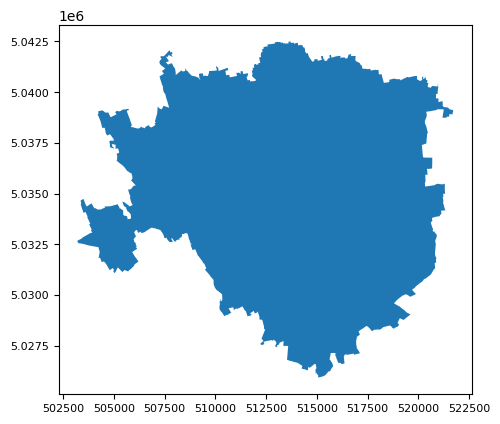

<class 'shapely.geometry.polygon.Polygon'>


In [61]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
# changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)

# Plot and store the axis object
ax = city.plot()

# Customize the font size of the tick labels on the axes
ax.tick_params(axis='both', which='major', labelsize=8)

# Display the plot
plt.show()

# Print the type of geometry for your information
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [62]:
import os

# the full directory path where the file should be saved
directory_path = "C:/Users/Камила/Big data/charging_stations/task_2/map/"

# check if the directory exists, and if not, create it
os.makedirs(directory_path, exist_ok=True)

# save the geometry file
city.to_file(f"{directory_path}{name}.shp")

## Division into grid

In [63]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


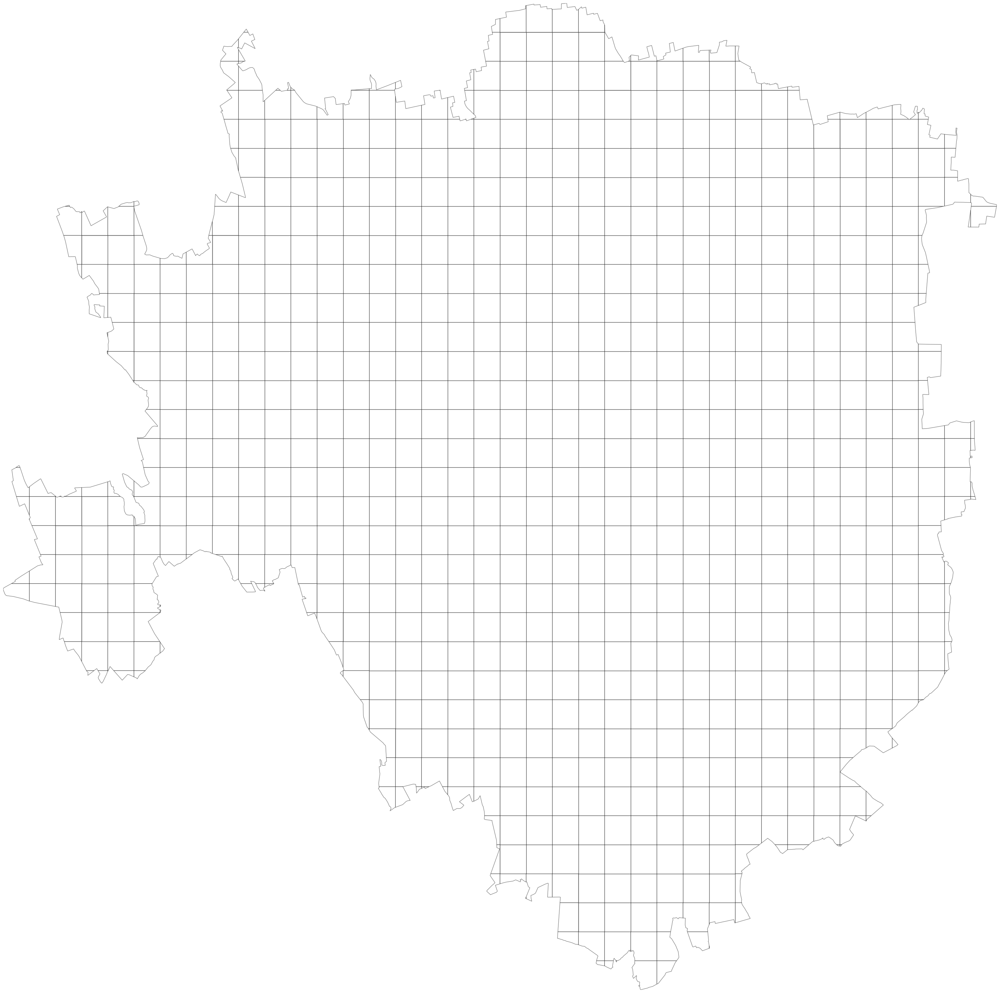

In [64]:
import shapely.geometry as sg
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

# Manual patch creation
fig, ax = plt.subplots(figsize=(40, 40))
for polygon in geometry_cut.geoms:
    if isinstance(polygon, sg.Polygon) and not polygon.is_empty:
        verts = np.array(polygon.exterior.coords)
        codes = np.full(len(verts), Path.LINETO)
        codes[0] = Path.MOVETO
        codes[-1] = Path.CLOSEPOLY
        path = Path(verts, codes)
        patch = PathPatch(path, facecolor='white', edgecolor='black', alpha=0.5)
        ax.add_patch(patch)

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [65]:
city_polyframe = gpd.GeoDataFrame(geometry=polylist)
city_polyframe.crs = city.crs
print(city_polyframe.crs)
city_polyframe.head()

EPSG:32632


,geometry
0,"POLYGON ((503197.317 5032658.859, 503202.066 5..."
1,"POLYGON ((503351.321 5032751.474, 503423.564 5..."
2,"POLYGON ((503684.911 5032962.282, 503837.189 5..."
3,"POLYGON ((503891.714 5033238.607, 503777.065 5..."
4,"POLYGON ((503731.655 5033725.740, 503684.911 5..."


(5682612.359536206, 5706278.0124538)

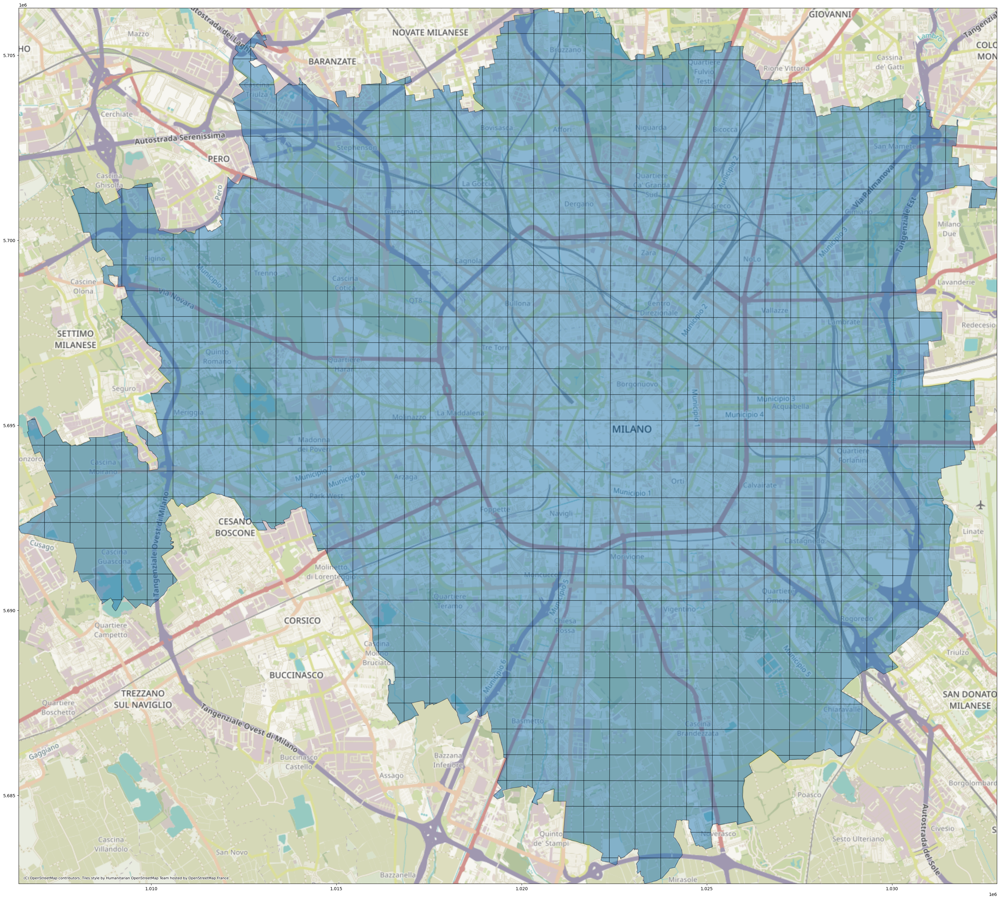

In [66]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = city_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

## POI

In [67]:
city_polyframe_lat_long = ox.project_gdf(city_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
city_polyframe_lat_long.head()

,geometry
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44756, ..."
1,"POLYGON ((9.04286 45.44828, 9.04378 45.44861, ..."
2,"POLYGON ((9.04712 45.45018, 9.04907 45.45095, ..."
3,"POLYGON ((9.04977 45.45266, 9.04831 45.45493, ..."
4,"POLYGON ((9.04773 45.45705, 9.04713 45.45795, ..."


## EV stations

In [68]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)

In [69]:
EV_stations.head()

amenity       brand capacity  \
element_type osmid                                               
node         2316703852  charging_station  Green Move        8   
             2316703853  charging_station    e-moving        2   
             2316703854  charging_station    e-moving        4   
             2608634432  charging_station         NaN      NaN   
             3396938704  charging_station         NaN      NaN   

                                         geometry operator operator:wikidata  \
element_type osmid                                                             
node         2316703852  POINT (9.23222 45.47858)      NaN               NaN   
             2316703853  POINT (9.23550 45.48429)      a2a           Q279978   
             2316703854  POINT (9.22631 45.47919)      a2a           Q279978   
             2608634432  POINT (9.21431 45.48407)      NaN               NaN   
             3396938704  POINT (9.18446 45.46444)      NaN               NaN   

                        operator:wikipedia            ref fuel:electricity  \
element_type osmid                                                           
node         2316703852                NaN            NaN              NaN   
             2316703853             it:A2A  IT MI001 0026              NaN   
             2316703854             it:A2A            NaN              yes   
             2608634432                NaN            NaN              NaN   
             3396938704                NaN            NaN              NaN   

                               mapillary  ... source maxstay socket:chademo  \
element_type osmid                        ...                                 
node         2316703852              NaN  ...    NaN     NaN            NaN   
             2316703853              NaN  ...    NaN     NaN            NaN   
             2316703854  533463068033486  ...    NaN     NaN            NaN   
             2608634432              NaN  ...    NaN     NaN            NaN   
             3396938704              NaN  ...    NaN     NaN            NaN   

                        socket:chademo:output socket:type2_combo  \
element_type osmid                                                 
node         2316703852                   NaN                NaN   
             2316703853                   NaN                NaN   
             2316703854                   NaN                NaN   
             2608634432                   NaN                NaN   
             3396938704                   NaN                NaN   

                        socket:type2_combo:output addr:housenumber  \
element_type osmid                                                   
node         2316703852                       NaN              NaN   
             2316703853                       NaN              NaN   
             2316703854                       NaN              NaN   
             2608634432                       NaN              NaN   
             3396938704                       NaN              NaN   

                        addr:postcode addr:street nodes  
element_type osmid                                       
node         2316703852           NaN         NaN   NaN  
             2316703853           NaN         NaN   NaN  
             2316703854           NaN         NaN   NaN  
             2608634432           NaN         NaN   NaN  
             3396938704           NaN         NaN   NaN  

[5 rows x 57 columns]

Text(0.5, 1.0, 'Milan EV stations')

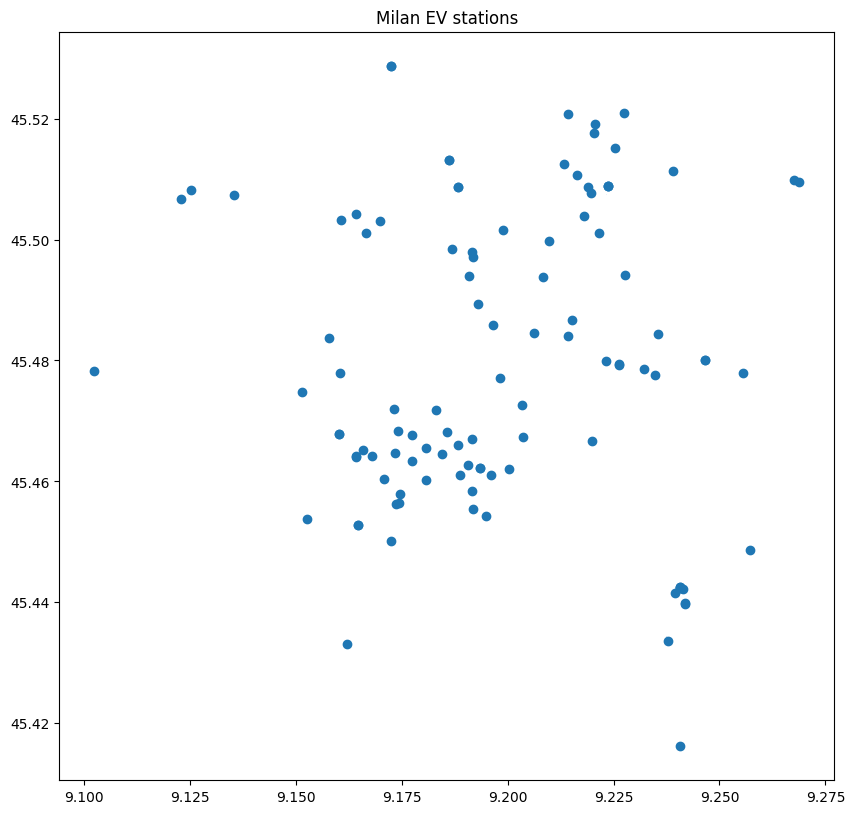

In [70]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title("Milan EV stations")

Text(0.5, 1.0, 'Milan EV stations')

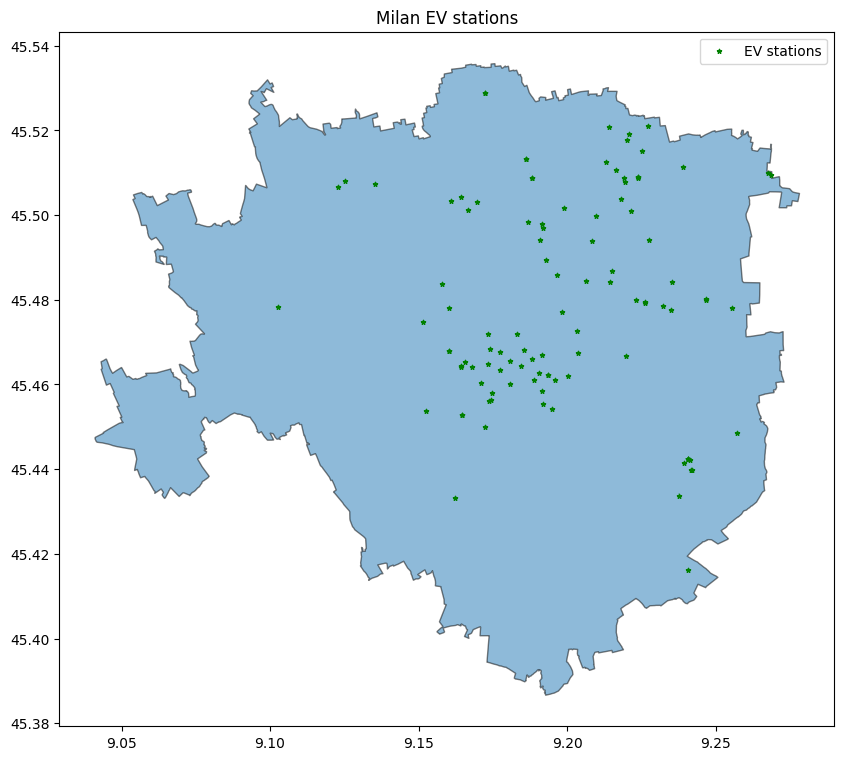

In [71]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title("Milan EV stations")

In [72]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,city_polyframe.shape[0])):
    pip_mask = EV_stations.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\3985573752.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 903/903 [00:00<00:00, 8984.94it/s]


In [73]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,city_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['geometry']]], ignore_index=True)

100%|██████████| 903/903 [00:04<00:00, 197.05it/s]


In [74]:
milan_polyframe_lat_long_new = city_polyframe_lat_long.copy()
milan_polyframe_lat_long_new['EV_stations_counts'] = 0
milan_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [75]:
for i in tqdm(range(0,milan_polyframe_lat_long_new.shape[0])):
    milan_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    milan_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

100%|██████████| 903/903 [00:03<00:00, 232.37it/s]


In [76]:
#How many EV stations in each grid
milan_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
milan_polyframe_lat_long_new['EV_stations_counts'].value_counts() / milan_polyframe_lat_long_new.shape[0]

0    0.919158
1    0.050941
2    0.024363
3    0.003322
4    0.001107
7    0.001107
Name: EV_stations_counts, dtype: float64

In [77]:
milan_polyframe_lat_long_new.head(5)

,geometry,EV_stations_counts,EV_stations_geomery
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44756, ...",0,[]
1,"POLYGON ((9.04286 45.44828, 9.04378 45.44861, ...",0,[]
2,"POLYGON ((9.04712 45.45018, 9.04907 45.45095, ...",0,[]
3,"POLYGON ((9.04977 45.45266, 9.04831 45.45493, ...",0,[]
4,"POLYGON ((9.04773 45.45705, 9.04713 45.45795, ...",0,[]


## Population data visualize and add to each grid

Data is retrieved from : https://data.humdata.org/dataset/italy-high-resolution-population-density-maps-demographic-estimates

In [85]:
df_pop = pd.read_csv(r'C:\Users\Камила\Big_data\charging_stations\task_2\ita_general_2020.csv')

In [86]:
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.longitude, df_pop.latitude))

In [87]:
df_pop.head()

,longitude,latitude,ita_general_2020
0,6.215694,48.000139,1.061017
1,6.216250,48.000139,1.061017
2,6.216528,48.000139,1.061017
3,6.243750,48.000139,0.831058
4,6.244028,48.000139,0.831058


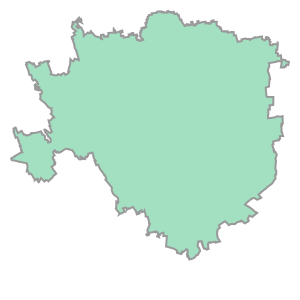

In [89]:
#extract population data for Milan
city.geometry[0]

In [90]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry'])

In [91]:
milan_pop_gdf = gdf.loc[pip_mask]

<Axes: >

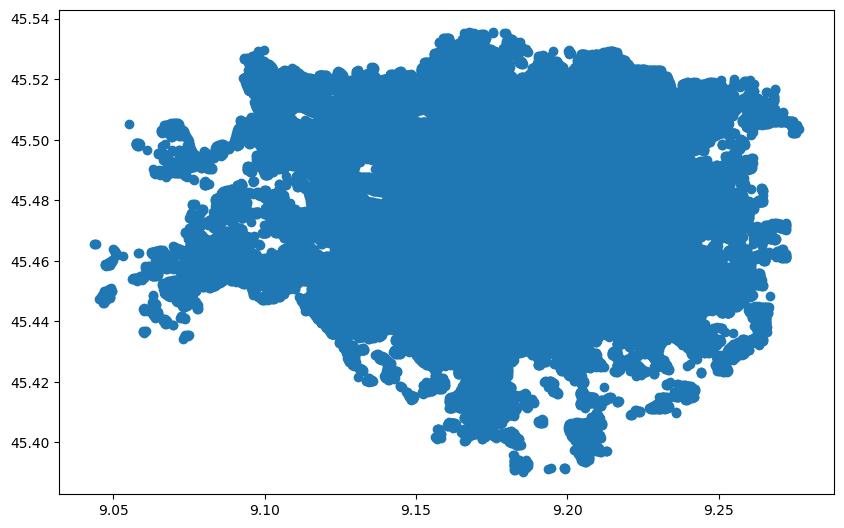

In [92]:
#plot population data with cmap
milan_pop_gdf.plot(figsize=(10,10))

In [98]:
milan_pop_gdf.to_csv(f"C:/Users/Камила/Big_data/charging_stations/task_2/{name}-population.csv")

In [99]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = milan_pop_gdf.within(city_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 903/903 [00:09<00:00, 90.39it/s] 


In [100]:
pop_grid = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    pop_grid.append(milan_pop_gdf.loc[masks_pop[i]].ita_general_2020.mean())

In [101]:
pop_grid = np.nan_to_num(pop_grid)

In [102]:
milan_polyframe_lat_long_new['population'] = pop_grid
milan_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44756, ...",0,[],0.184004
1,"POLYGON ((9.04286 45.44828, 9.04378 45.44861, ...",0,[],0.187754
2,"POLYGON ((9.04712 45.45018, 9.04907 45.45095, ...",0,[],0.187754
3,"POLYGON ((9.04977 45.45266, 9.04831 45.45493, ...",0,[],0.000000
4,"POLYGON ((9.04773 45.45705, 9.04713 45.45795, ...",0,[],0.969001


C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\1951985057.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['EV stations'])


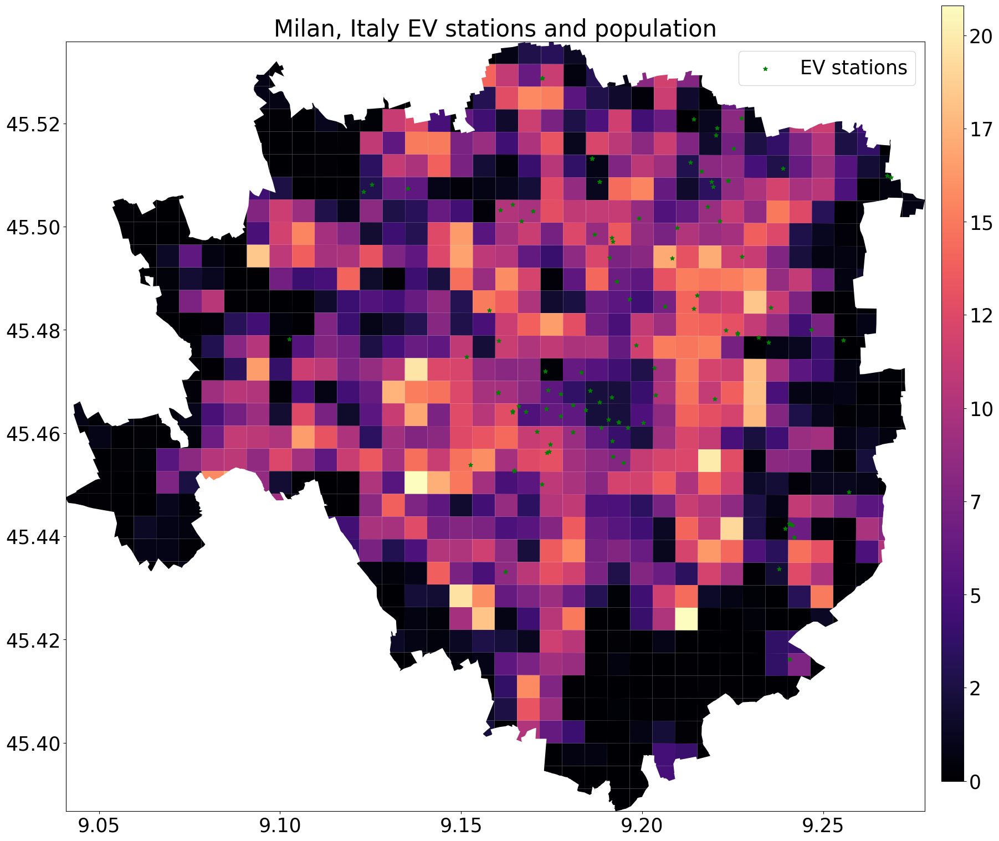

In [103]:
plt.rcParams.update({'font.size':25})
west, south, east, north = milan_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
milan_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=30, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(milan_polyframe_lat_long_new.population), vmax=max(milan_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

## Land use

In [104]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\4238397865.py:1: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})


In [106]:
landuse.to_csv(f"C:/Users/Камила/Big_data/charging_stations/task_2/{name}-landuse.csv")

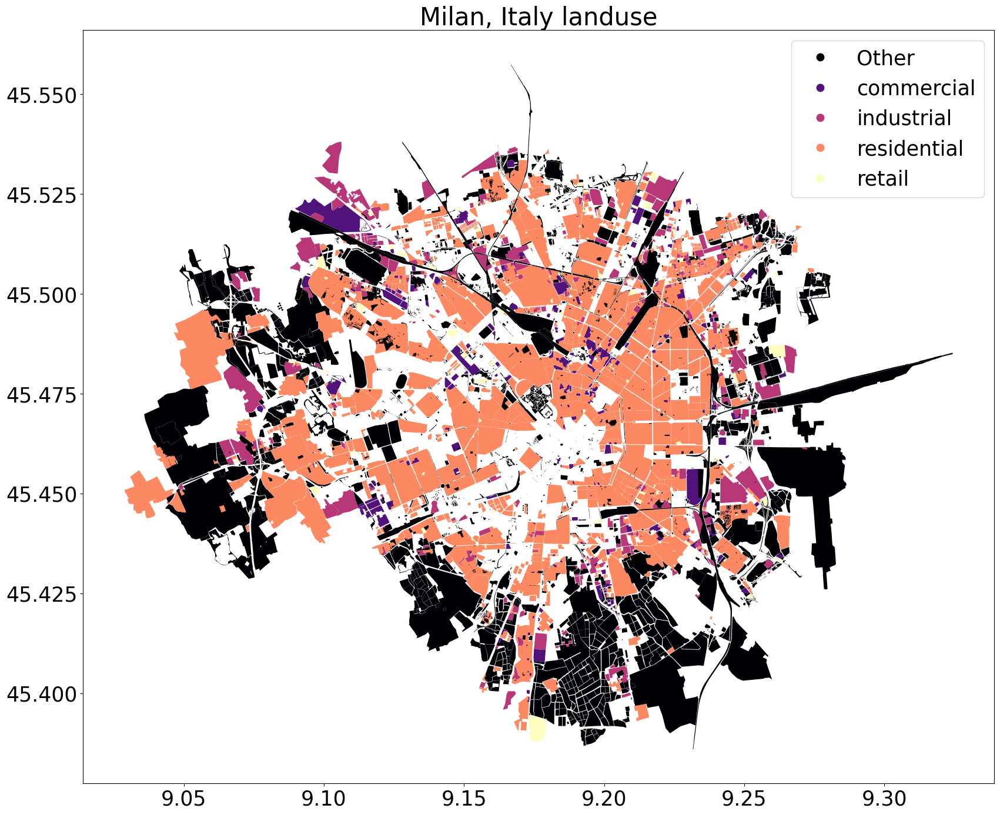

In [107]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
plt.title(f'{PLACE_NAME} landuse')
plt.show()

In [108]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [109]:
masks_land_use = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 903/903 [00:00<00:00, 1279.58it/s]


In [110]:
land_labels = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [111]:
milan_polyframe_lat_long_new['landuse'] = land_labels

In [112]:
milan_polyframe_lat_long_new.landuse.value_counts()

Other          821
residential     41
industrial      24
commercial      10
retail           7
Name: landuse, dtype: int64

C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\3462182474.py:8: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


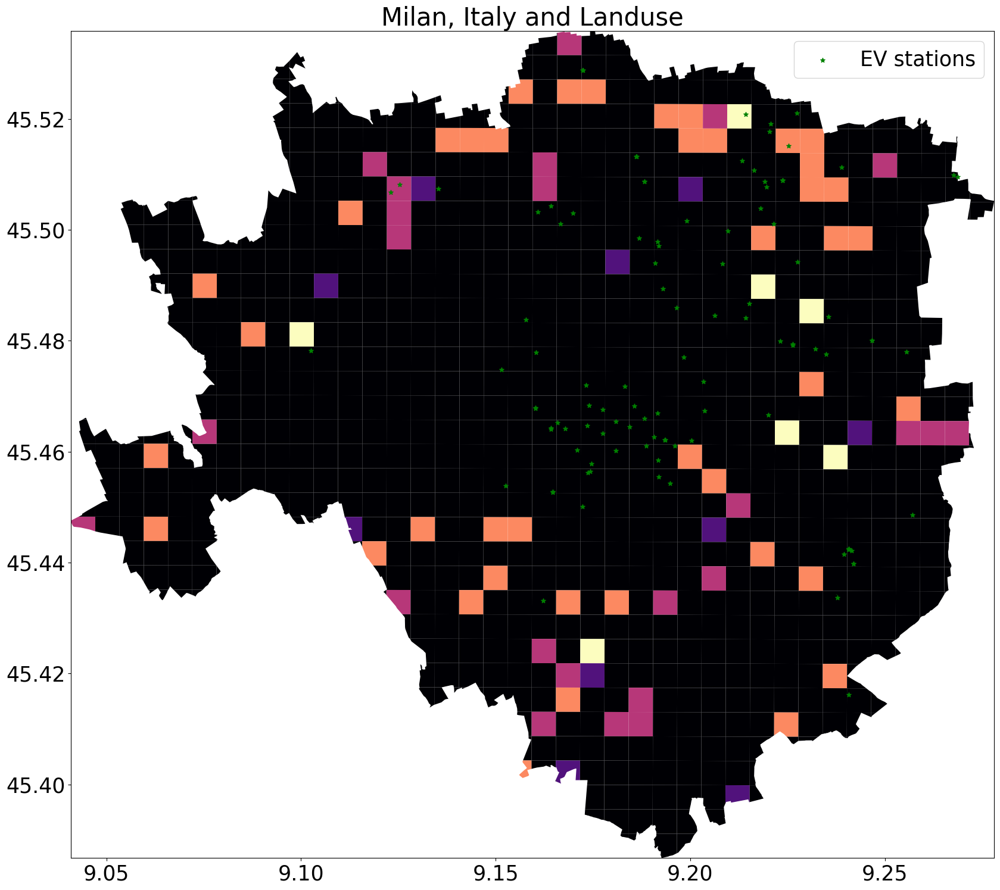

In [113]:
plt.rcParams.update({'font.size':25})
west, south, east, north = milan_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
milan_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=30, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

In [114]:
milan_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population,landuse
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44756, ...",0,[],0.184004,industrial
1,"POLYGON ((9.04286 45.44828, 9.04378 45.44861, ...",0,[],0.187754,Other
2,"POLYGON ((9.04712 45.45018, 9.04907 45.45095, ...",0,[],0.187754,Other
3,"POLYGON ((9.04977 45.45266, 9.04831 45.45493, ...",0,[],0.000000,Other
4,"POLYGON ((9.04773 45.45705, 9.04713 45.45795, ...",0,[],0.969001,Other


## Road connectivity

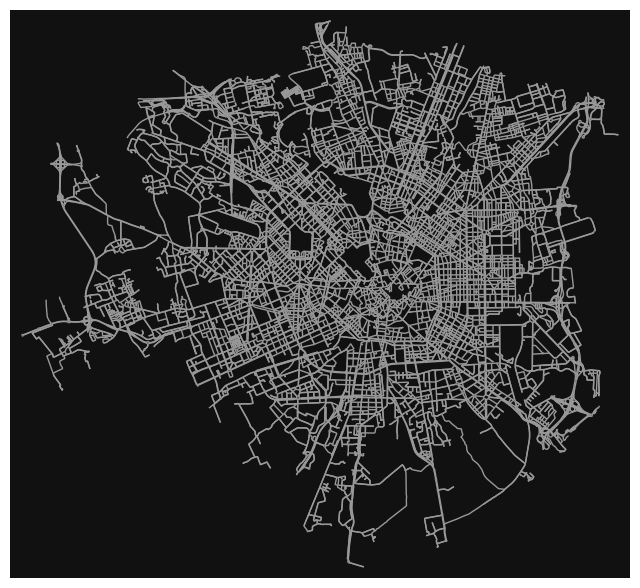

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [115]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [116]:
area,edges = ox.graph_to_gdfs(G)

In [117]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    try: 
        poly = city_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)

100%|██████████| 903/903 [23:09<00:00,  1.54s/it]  


In [118]:
#add nodes, edges and density to the dataframe
milan_polyframe_lat_long_new['nodes'] = nodes
milan_polyframe_lat_long_new['edges'] = edges
milan_polyframe_lat_long_new['density'] = density

C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\3771775831.py:12: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


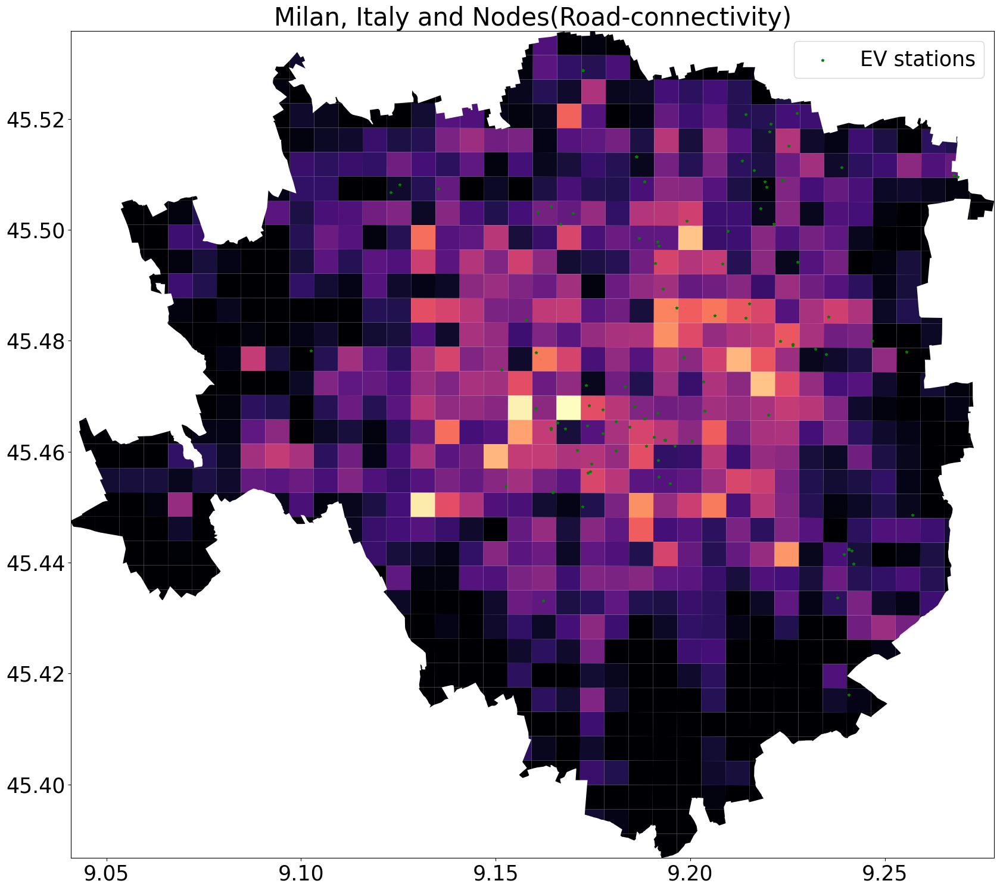

In [119]:
# relation between EVCSs and nodes
plt.rcParams.update({'font.size':25})
west, south, east, north = milan_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
milan_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\3449573971.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


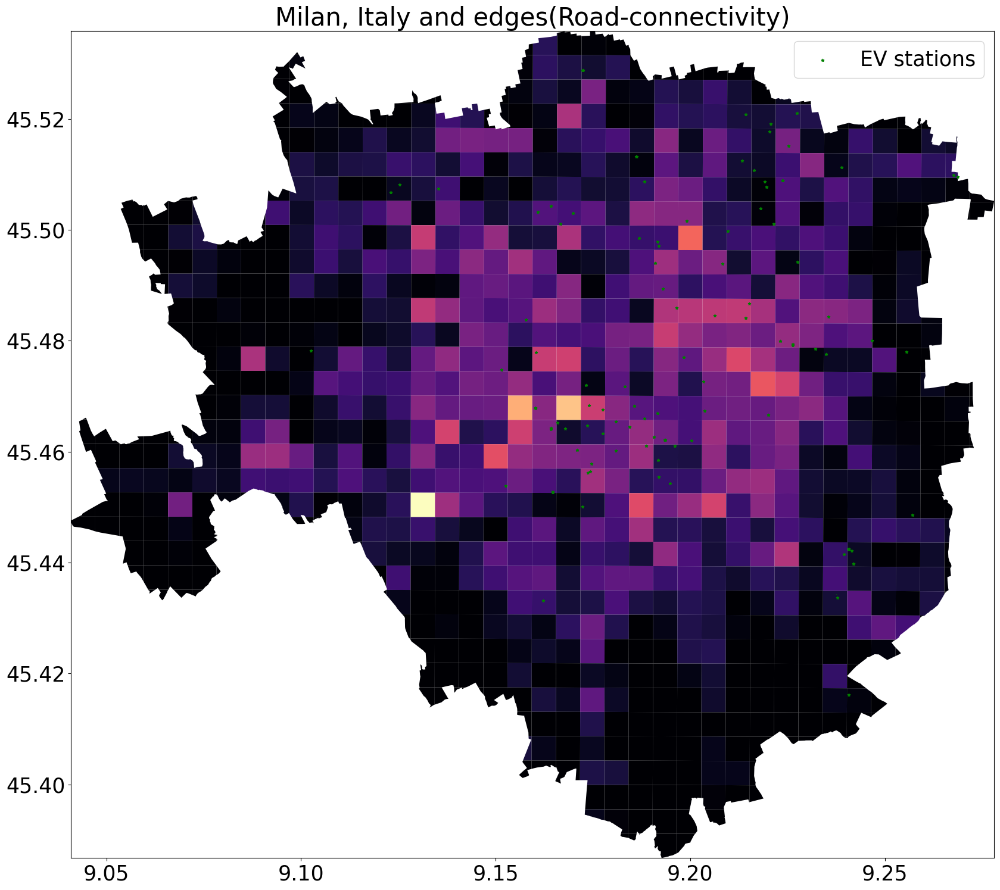

In [120]:
plt.rcParams.update({'font.size':25})
west, south, east, north = milan_polyframe_lat_long_new.unary_union.bounds

#edges
fig, ax = plt.subplots(figsize=(20,20))
milan_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\1755266671.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


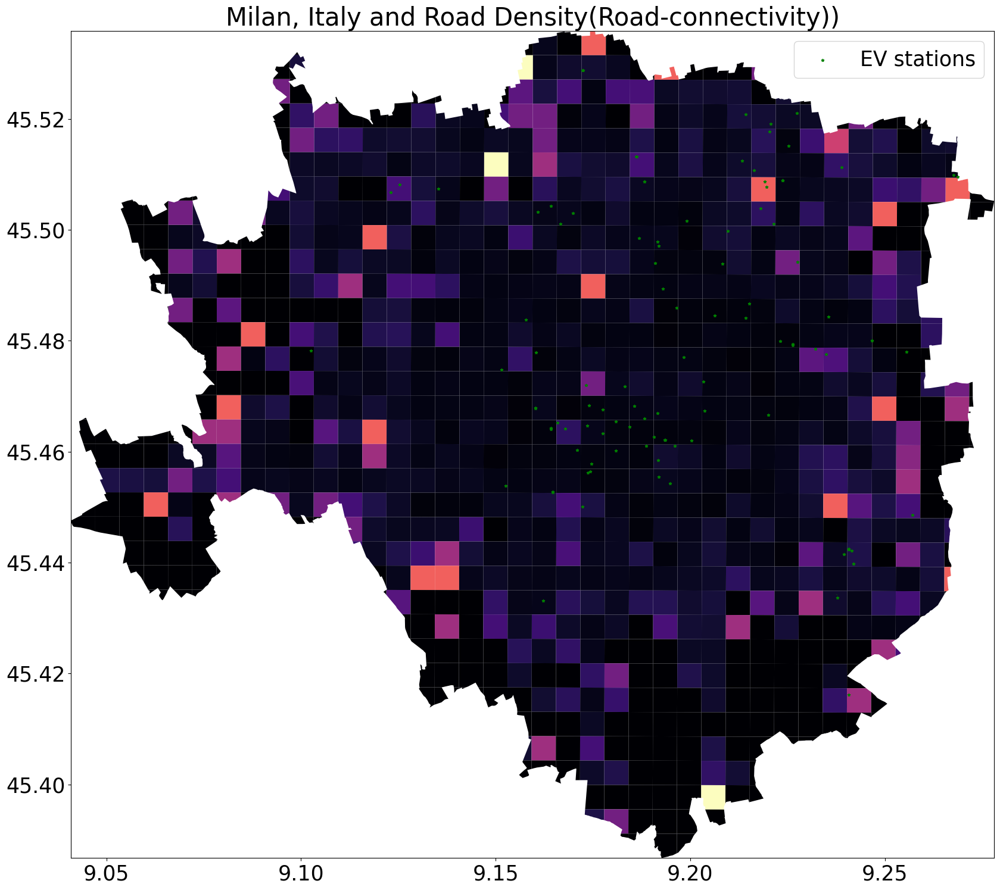

In [121]:
plt.rcParams.update({'font.size':25})
west, south, east, north = milan_polyframe_lat_long_new.unary_union.bounds

#density
fig, ax = plt.subplots(figsize=(20,20))
milan_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [122]:
milan_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population,landuse,nodes,edges,density
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44756, ...",0,[],0.184004,industrial,0,0,0.000000
1,"POLYGON ((9.04286 45.44828, 9.04378 45.44861, ...",0,[],0.187754,Other,0,0,0.000000
2,"POLYGON ((9.04712 45.45018, 9.04907 45.45095, ...",0,[],0.187754,Other,0,0,0.000000
3,"POLYGON ((9.04977 45.45266, 9.04831 45.45493, ...",0,[],0.000000,Other,7,8,0.190476
4,"POLYGON ((9.04773 45.45705, 9.04713 45.45795, ...",0,[],0.969001,Other,0,0,0.000000


## POIs

In [123]:
import osmnx as ox
import pandas as pd
from tqdm import tqdm

def count_features_in_grids(place_name, features, city_polyframe, dataframe_name):
    for feature_key, feature_list in features.items():
        for feature in feature_list:
            try:
                # Fetch geometries from OpenStreetMap
                geometries = ox.geometries_from_place(
                    place_name,
                    {feature_key: feature}
                )
                # Export to CSV if geometries are found
                if not geometries.empty:
                    geometries.to_csv(f"C:/Users/Камила/Big_data/charging_stations/task_2/Milan-{feature}.csv")

                    # Create masks for each grid
                    masks = []
                    for i in tqdm(range(0, city_polyframe.shape[0]), desc=f"Processing masks for {feature}"):
                        pip_mask = geometries.within(city_polyframe.loc[i, 'geometry'])
                        masks.append(pip_mask)

                    # Count features in each grid
                    feature_counts = []
                    for i in tqdm(range(0, city_polyframe.shape[0]), desc=f"Counting {feature}"):
                        feature_counts.append(geometries[masks[i]].shape[0])

                    # Add counts to the dataframe
                    dataframe_name[f'{feature}_count'] = feature_counts
                else:
                    print(f"No data found for {feature_key}='{feature}' in {place_name}.")
            except Exception as e:
                print(f"Failed to process {feature_key}='{feature}' in {place_name}: {str(e)}")

In [124]:
features = {
    'amenity': ['school', 'university', 'restaurant', 'place_of_worship', 
                'community_centre', 'townhall', 'parking', 'library'],
    'leisure': ['park', 'cinema'],
    'building': ['commercial', 'government', 'civic', 'retail']
}

city_polyframe = milan_polyframe_lat_long_new

count_features_in_grids(PLACE_NAME, features, city_polyframe, milan_polyframe_lat_long_new)

C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\2699899488.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(
Counting school: 100%|██████████| 903/903 [00:01<00:00, 582.84it/s]
C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\2699899488.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(
Counting university: 1

Failed to process leisure='cinema' in Milan, Italy: No data elements in server response. Check log and query location/tags.


C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\2699899488.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(
Counting commercial: 100%|██████████| 903/903 [00:01<00:00, 661.34it/s]
C:\Users\Камила\AppData\Local\Temp\ipykernel_12660\2699899488.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(
Counting governmen

In [125]:
milan_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,"POLYGON ((9.0408867 45.447447000000004, 9.0409...",POLYGON ((9.042856699064385 45.448279926194616...,"POLYGON ((9.04712422604665 45.450175773292244,...",POLYGON ((9.049771103089535 45.452661910662854...,"POLYGON ((9.047727805847954 45.45704756726762,..."
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.184004,0.187754,0.187754,0.0,0.969001
landuse,industrial,Other,Other,Other,Other
nodes,0,0,0,7,0
edges,0,0,0,8,0
density,0.0,0.0,0.0,0.190476,0.0
school_count,0,0,0,0,0
university_count,0,0,0,0,0


## Traffic

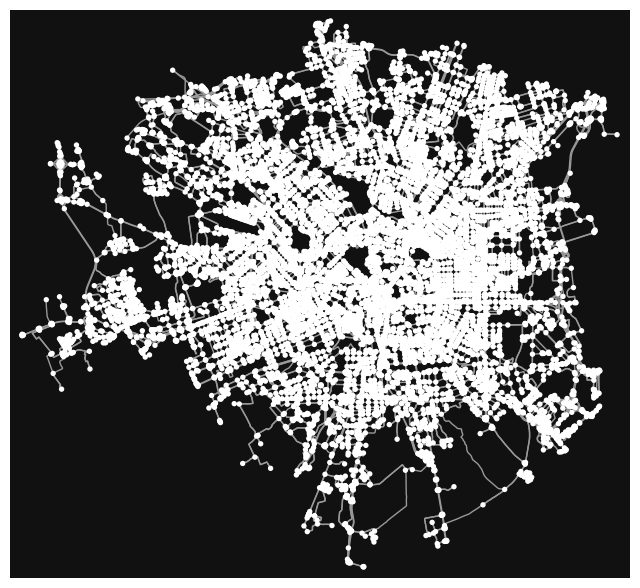

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [126]:
# Fetch road network data
milan_graph = ox.graph_from_place(PLACE_NAME, network_type='drive')

# Visualize the road network
ox.plot_graph(milan_graph)

In [127]:
# Convert the graph to edge GeoDataFrame
edges = ox.graph_to_gdfs(milan_graph, nodes=False, edges=True)

In [128]:
selected_columns = edges[['osmid', 'oneway', 'lanes', 'highway', 'maxspeed', 
                          'geometry']]

In [129]:
selected_columns.head()

osmid  oneway lanes    highway  \
u        v          key                                                    
10371529 743371634  0                 274433644    True     2    primary   
         743371622  0                  26703159    True   NaN   tertiary   
10371530 2754579083 0    [270390234, 270390223]    True     2    primary   
13595397 271096577  0                 195654896   False     2  secondary   
         344814479  0                 195654901    True   NaN  secondary   

                        maxspeed  \
u        v          key            
10371529 743371634  0        NaN   
         743371622  0        NaN   
10371530 2754579083 0         70   
13595397 271096577  0         50   
         344814479  0        NaN   

                                                                  geometry  
u        v          key                                                     
10371529 743371634  0      LINESTRING (9.07662 45.48756, 9.07469 45.48785)  
         743371622  0    LINESTRING (9.07662 45.48756, 9.07611 45.48771...  
10371530 2754579083 0    LINESTRING (9.10205 45.47981, 9.10170 45.47991...  
13595397 271096577  0      LINESTRING (9.13066 45.49953, 9.13021 45.49973)  
         344814479  0      LINESTRING (9.13066 45.49953, 9.13066 45.49967)

In [130]:
# Drop rows where any cell in that row is NA
selected_columns = selected_columns.dropna()

In [131]:
# Convert road network to a projected CRS
road_network = selected_columns.to_crs(epsg=32633)

# Also ensure your polygons are in the same CRS
milan_polyframe_lat_long_new = milan_polyframe_lat_long_new.to_crs(epsg=32633)

In [132]:
# Calculate centroids safely
road_centers = road_network.centroid

In [133]:
def check_one_way(polygon, roads):
    # Recalculate centroids here if necessary
    road_centers = roads.centroid  # Ensure 'roads' is already in a projected CRS
    within_mask = road_centers.within(polygon)
    one_way_roads = roads[within_mask & roads['oneway']]
    return 'Yes' if not one_way_roads.empty else 'No'

# Apply the function
milan_polyframe_lat_long_new['oneway_exists'] = milan_polyframe_lat_long_new['geometry'].apply(check_one_way, roads=road_network)

In [134]:
milan_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,"POLYGON ((34013.77521749155 5049957.578448736,...","POLYGON ((34174.69445882173 5050038.648575512,...","POLYGON ((34524.0272020995 5050224.446437803, ...","POLYGON ((34751.4966397644 5050485.246066694, ...","POLYGON ((34627.94333350612 5050984.299880253,..."
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.184004,0.187754,0.187754,0.0,0.969001
landuse,industrial,Other,Other,Other,Other
nodes,0,0,0,7,0
edges,0,0,0,8,0
density,0.0,0.0,0.0,0.190476,0.0
school_count,0,0,0,0,0
university_count,0,0,0,0,0


In [135]:
def check_highways(polygon, roads):
    # Calculate centroids for the roads and check if they fall within the given polygon
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    highways_within = roads.loc[within_mask, 'highway']

    # Flatten the list of highways if they are stored in lists within cells
    flattened_highways = []
    for item in highways_within.dropna():
        if isinstance(item, list):
            flattened_highways.extend(item)  # Extend the flat list with elements of the sublist
        else:
            flattened_highways.append(item)  # Append the item directly if it's not a list

    # Create a set of unique highway types, removing duplicates and handling unhashable types
    unique_highways = set(flattened_highways)
    return unique_highways if unique_highways else 'None'

In [136]:
milan_polyframe_lat_long_new['highway_types'] = milan_polyframe_lat_long_new['geometry'].apply(check_highways, roads=road_network)

In [137]:
milan_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,"POLYGON ((34013.77521749155 5049957.578448736,...","POLYGON ((34174.69445882173 5050038.648575512,...","POLYGON ((34524.0272020995 5050224.446437803, ...","POLYGON ((34751.4966397644 5050485.246066694, ...","POLYGON ((34627.94333350612 5050984.299880253,..."
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.184004,0.187754,0.187754,0.0,0.969001
landuse,industrial,Other,Other,Other,Other
nodes,0,0,0,7,0
edges,0,0,0,8,0
density,0.0,0.0,0.0,0.190476,0.0
school_count,0,0,0,0,0
university_count,0,0,0,0,0


In [138]:
def aggregate_lanes(polygon, roads):
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    lanes_within = roads.loc[within_mask, 'lanes'].dropna()
    # Convert data to numeric, because 'lanes' might be stored as strings
    lanes_within = pd.to_numeric(lanes_within, errors='coerce')
    return lanes_within.mean()  # You could also consider sum, max, or other aggregations

In [139]:
milan_polyframe_lat_long_new['average_lanes'] = milan_polyframe_lat_long_new['geometry'].apply(aggregate_lanes, roads=road_network)

In [140]:
def aggregate_maxspeed(polygon, roads):
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    maxspeed_within = roads.loc[within_mask, 'maxspeed'].dropna()
    
    # Process each maxspeed entry, whether list or string, to get numeric values
    def process_maxspeed_entry(entry):
        if isinstance(entry, list):
            # Assuming the list has a string with the first element as the speed
            return pd.to_numeric(entry[0].split(' ')[0], errors='coerce')
        elif isinstance(entry, str):
            return pd.to_numeric(entry.split(' ')[0], errors='coerce')
        else:
            return pd.NA  # Pandas' NA for missing type-aware handling

    # Apply processing function to each item in the series
    maxspeed_numeric = maxspeed_within.apply(process_maxspeed_entry)
    return maxspeed_numeric.mean()  # Calculate mean of the cleaned, numeric maxspeed values

In [141]:
milan_polyframe_lat_long_new['average_maxspeed'] = milan_polyframe_lat_long_new['geometry'].apply(aggregate_maxspeed, roads=road_network)

In [142]:
milan_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,"POLYGON ((34013.77521749155 5049957.578448736,...","POLYGON ((34174.69445882173 5050038.648575512,...","POLYGON ((34524.0272020995 5050224.446437803, ...","POLYGON ((34751.4966397644 5050485.246066694, ...","POLYGON ((34627.94333350612 5050984.299880253,..."
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.184004,0.187754,0.187754,0.0,0.969001
landuse,industrial,Other,Other,Other,Other
nodes,0,0,0,7,0
edges,0,0,0,8,0
density,0.0,0.0,0.0,0.190476,0.0
school_count,0,0,0,0,0
university_count,0,0,0,0,0
